In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [10]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}]
    
    return error

# Train/Test Model

In [11]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [12]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [13]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [14]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,5)

X_train Shape : (12043, 5, 1)
y_train Shape : (12043, 1)
X_test Shape :  (3013, 5, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [15]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [16]:
test1 = test.copy()

In [17]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 6s 8ms/step - loss: 0.0115 - val_loss: 0.0035
Epoch 2/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0022 - val_loss: 0.0032
Epoch 3/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 4/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 6/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0021

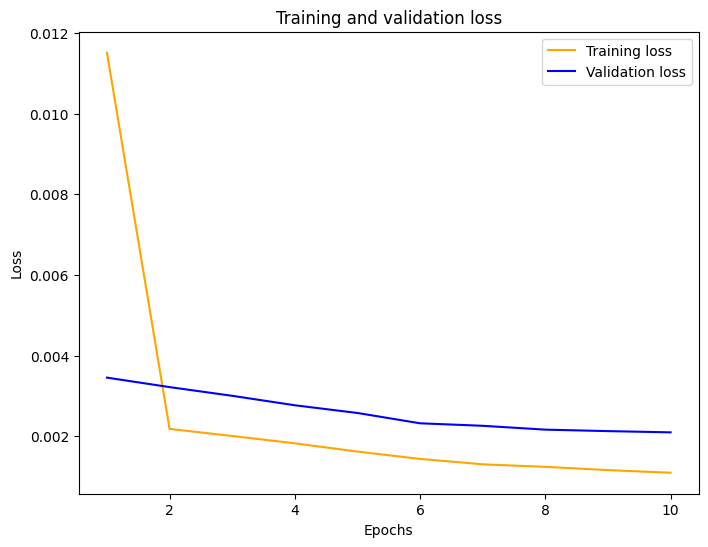

In [18]:
plot_curve(hist_adam)

In [19]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.547260
1,2021-12-10 15:25:00,0.588,0.525448
2,2021-12-10 15:26:00,0.566,0.559986
3,2021-12-10 15:27:00,0.562,0.562411
4,2021-12-10 15:28:00,0.612,0.556879
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865
3009,2021-12-16 13:59:00,0.169,0.168296
3010,2021-12-16 14:00:00,0.147,0.168693
3011,2021-12-16 14:01:00,0.145,0.155700


In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [21]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.0020844719452372423,
  'RMSE': 0.0456560176234989,
  'MAE': 0.02330437587247095,
  'MAPE': 0.08621971805579473}]

In [212]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\2791275614.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.08622,0.002084,0.045656


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [23]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 9ms/step - loss: 0.0101 - val_loss: 0.0033
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0021 - val_loss: 0.0026
Epoch 3/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 6/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0010 - val_loss: 0.0026
Epoch 10/10
377/377 [==============================] - 2s 5ms/step - loss: 9.9134e-04 - val_loss: 0.

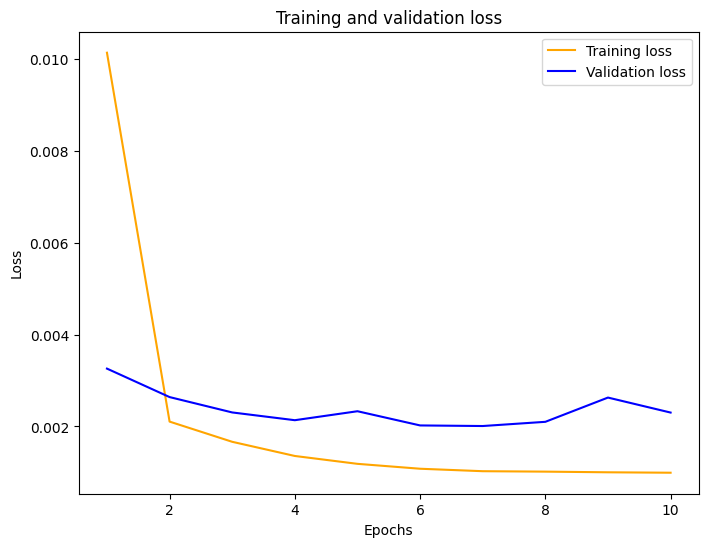

In [24]:
plot_curve(hist_50_rms)

In [25]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.547260,0.572484
1,2021-12-10 15:25:00,0.588,0.525448,0.556068
2,2021-12-10 15:26:00,0.566,0.559986,0.609156
3,2021-12-10 15:27:00,0.562,0.562411,0.583630
4,2021-12-10 15:28:00,0.612,0.556879,0.579550
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.176585
3009,2021-12-16 13:59:00,0.169,0.168296,0.176536
3010,2021-12-16 14:00:00,0.147,0.168693,0.177535
3011,2021-12-16 14:01:00,0.145,0.155700,0.155952


In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [27]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0022898094670620907,
  'RMSE': 0.04785195363892775,
  'MAE': 0.02605121149466436,
  'MAPE': 0.0995423291857784}]

In [28]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.08621971805579473


,Model,MSE error
0,model,0.086220
1,model_1,0.099542


In [213]:
data1 = [{'Lags':5 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\2392259794.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [30]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
189/189 [==============================] - 5s 10ms/step - loss: 0.0189 - val_loss: 0.0035
Epoch 2/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0022 - val_loss: 0.0034
Epoch 3/10
189/189 [==============================] - 2s 8ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 4/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0021 - val_loss: 0.0032
Epoch 5/10
189/189 [==============================] - 1s 6ms/step - loss: 0.0020 - val_loss: 0.0031
Epoch 6/10
189/189 [==============================] - 1s 6ms/step - loss: 0.0019 - val_loss: 0.0030
Epoch 7/10
189/189 [==============================] - 1s 5ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 8/10
189/189 [==============================] - 1s 5ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 9/10
189/189 [==============================] - 1s 6ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 10/10
189/189 [==============================] - 1s 5ms/step - loss: 0.0015 - val_loss: 0.002

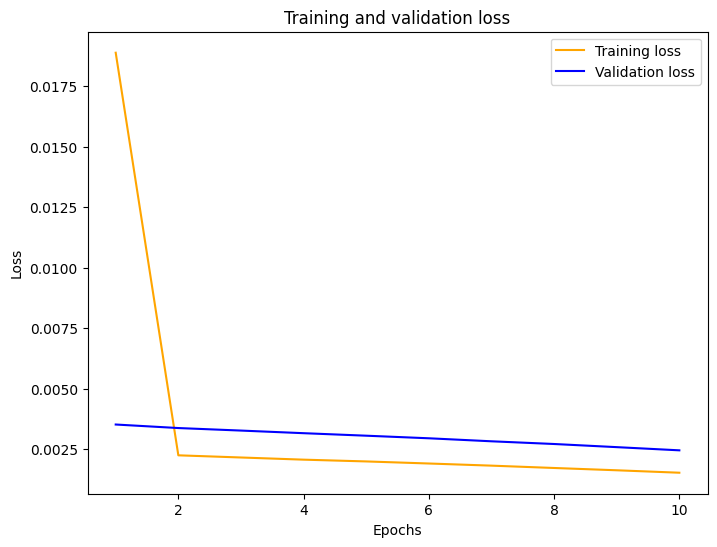

In [31]:
plot_curve(hist_batch_size64)

In [32]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.547260,0.572484,0.591869
1,2021-12-10 15:25:00,0.588,0.525448,0.556068,0.564469
2,2021-12-10 15:26:00,0.566,0.559986,0.609156,0.566786
3,2021-12-10 15:27:00,0.562,0.562411,0.583630,0.565061
4,2021-12-10 15:28:00,0.612,0.556879,0.579550,0.564194
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.176585,0.170570
3009,2021-12-16 13:59:00,0.169,0.168296,0.176536,0.170260
3010,2021-12-16 14:00:00,0.147,0.168693,0.177535,0.170318
3011,2021-12-16 14:01:00,0.145,0.155700,0.155952,0.163065


In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [34]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

[{'MSE': 0.0024401669926698865,
  'RMSE': 0.04939804644588576,
  'MAE': 0.026094707665097618,
  'MAPE': 0.10432419921917423}]

In [35]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.08621971805579473


,Model,MSE error
0,model,0.086220
1,model_1,0.104324


In [214]:
data2 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\3116887897.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398


---

### learning rate 0.1

In [37]:
test2 = test.copy()

#### Add frist layer: units = 50

In [38]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 10ms/step - loss: 0.0582 - val_loss: 0.0026
Epoch 2/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 4/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 5/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 6/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0037
Epoch 10/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.002

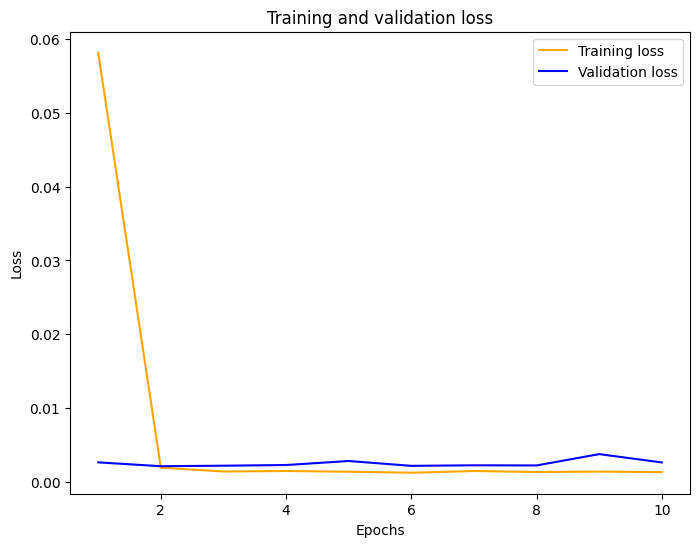

In [39]:
plot_curve(hist_01)

In [40]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.570223
1,2021-12-10 15:25:00,0.588,0.557286
2,2021-12-10 15:26:00,0.566,0.622876
3,2021-12-10 15:27:00,0.562,0.586639
4,2021-12-10 15:28:00,0.612,0.581576
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.176974
3009,2021-12-16 13:59:00,0.169,0.177019
3010,2021-12-16 14:00:00,0.147,0.177932
3011,2021-12-16 14:01:00,0.145,0.159247


In [41]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [42]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.0025862132008132267,
  'RMSE': 0.05085482475452282,
  'MAE': 0.029741370388663684,
  'MAPE': 0.12287361474926636}]

In [43]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.08621971805579473


,Model,MSE error
0,model,0.086220
1,model_1,0.122874


In [215]:
data3 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\1270089500.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [45]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 10ms/step - loss: 0.0144 - val_loss: 0.0022
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 3/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 5/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0025
Epoch 6/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 10/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.002

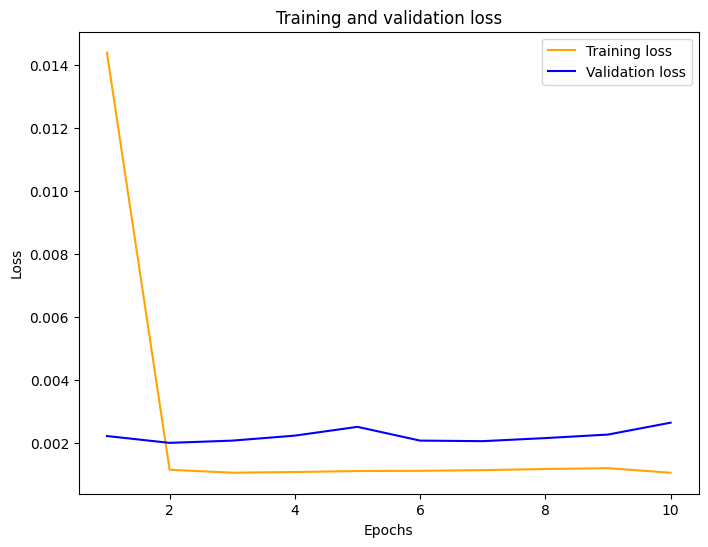

In [46]:
plot_curve(hist_005)

In [47]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.570223,0.522674
1,2021-12-10 15:25:00,0.588,0.557286,0.505099
2,2021-12-10 15:26:00,0.566,0.622876,0.554129
3,2021-12-10 15:27:00,0.562,0.586639,0.534984
4,2021-12-10 15:28:00,0.612,0.581576,0.532475
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.176974,0.155392
3009,2021-12-16 13:59:00,0.169,0.177019,0.155333
3010,2021-12-16 14:00:00,0.147,0.177932,0.156233
3011,2021-12-16 14:01:00,0.145,0.159247,0.136731


In [48]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [49]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.0026272713463237492,
  'RMSE': 0.051256915107366234,
  'MAE': 0.03240970160890157,
  'MAPE': 0.10915364273109081}]

In [50]:
compare_model(lstm_mape_error,lstm_mape_error4)

Better MSE value is :  0.08621971805579473


,Model,MSE error
0,model,0.086220
1,model_1,0.109154


In [216]:
data4 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\2815516824.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [85]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 5s 6ms/step - loss: 0.0048 - val_loss: 0.0026
Epoch 2/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0032
Epoch 3/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 6/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021

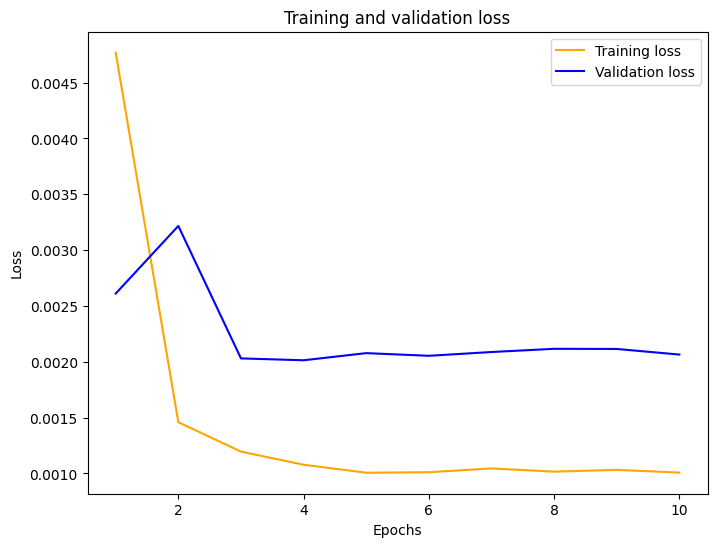

In [86]:
plot_curve(hist_001)

In [87]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.570223,0.522674,0.553314,0.547942,0.551804
1,2021-12-10 15:25:00,0.588,0.557286,0.505099,0.533709,0.531123,0.534024
2,2021-12-10 15:26:00,0.566,0.622876,0.554129,0.588047,0.584576,0.586948
3,2021-12-10 15:27:00,0.562,0.586639,0.534984,0.556122,0.555241,0.558239
4,2021-12-10 15:28:00,0.612,0.581576,0.532475,0.557684,0.554593,0.557317
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.176974,0.155392,0.161063,0.177653,0.167733
3009,2021-12-16 13:59:00,0.169,0.177019,0.155333,0.161171,0.177613,0.167803
3010,2021-12-16 14:00:00,0.147,0.177932,0.156233,0.162191,0.178576,0.168828
3011,2021-12-16 14:01:00,0.145,0.159247,0.136731,0.139604,0.157903,0.146703


In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [89]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.0020541729519845376,
  'RMSE': 0.04532298480886423,
  'MAE': 0.022388099012205887,
  'MAPE': 0.0924305164141375}]

In [90]:
compare_model(lstm_mape_error,lstm_mape_error5)

Better MSE value is :  0.08621971805579473


,Model,MSE error
0,model,0.086220
1,model_1,0.092431


In [217]:
data5 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\158870608.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [59]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 5s 6ms/step - loss: 0.0048 - val_loss: 0.0033
Epoch 2/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 2s 4ms/step - loss: 9.8230e-04 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 2s 4ms/step - loss: 9.9752e-04 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 2s 4ms/step - loss: 9.8909e-04 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 4ms/step - loss: 9.9945e-04 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 2s 4ms/step - loss: 9.8870e-0

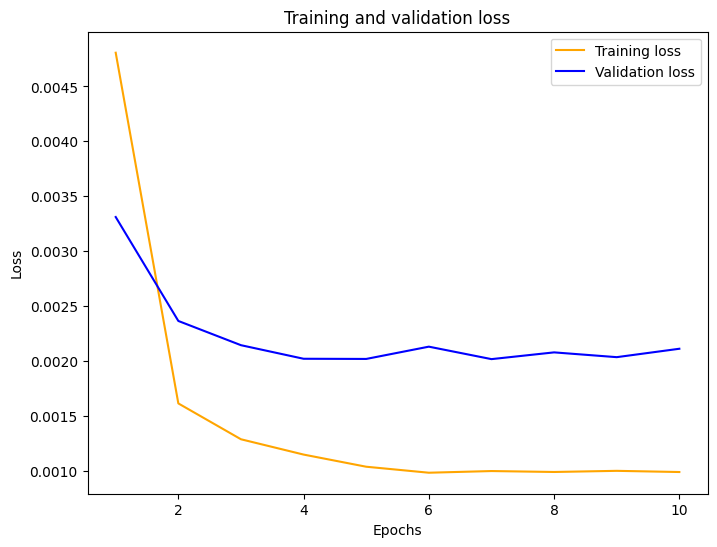

In [60]:
plot_curve(hist_0005)

In [61]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.570223,0.522674,0.551804,0.547942
1,2021-12-10 15:25:00,0.588,0.557286,0.505099,0.534024,0.531123
2,2021-12-10 15:26:00,0.566,0.622876,0.554129,0.586948,0.584576
3,2021-12-10 15:27:00,0.562,0.586639,0.534984,0.558239,0.555241
4,2021-12-10 15:28:00,0.612,0.581576,0.532475,0.557317,0.554593
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.176974,0.155392,0.167733,0.177653
3009,2021-12-16 13:59:00,0.169,0.177019,0.155333,0.167803,0.177613
3010,2021-12-16 14:00:00,0.147,0.177932,0.156233,0.168828,0.178576
3011,2021-12-16 14:01:00,0.145,0.159247,0.136731,0.146703,0.157903


In [62]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [63]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

[{'MSE': 0.0021005474927519078,
  'RMSE': 0.0458317301959233,
  'MAE': 0.025692393128777156,
  'MAPE': 0.12322189337146953}]

In [64]:
compare_model(lstm_mape_error5,lstm_mape_error6)

Better MSE value is :  0.07511632127196016


,Model,MSE error
0,model,0.075116
1,model_1,0.123222


In [218]:
data5 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\496555878.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [98]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 5s 6ms/step - loss: 0.0125 - val_loss: 0.0035
Epoch 2/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0022 - val_loss: 0.0034
Epoch 3/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 4/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 6/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 2s 4ms/step - loss: 0.0011 - val_loss: 0.0020

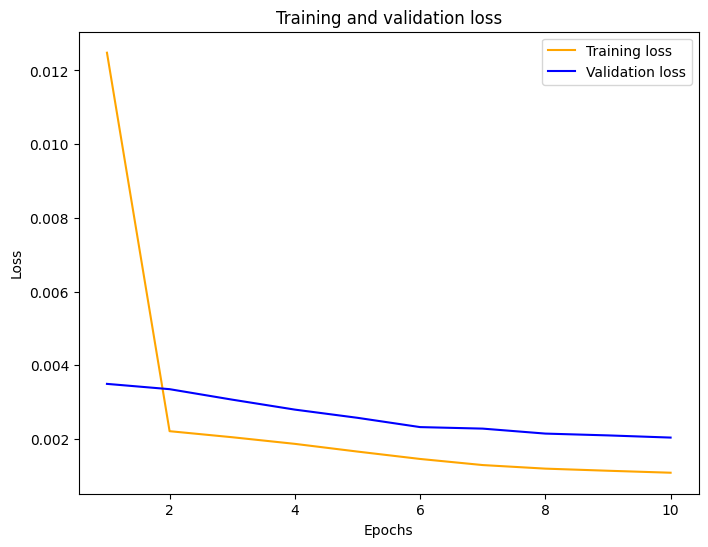

In [99]:
plot_curve(hist_0001)

In [104]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.570223,0.522674,0.553314,0.547942,0.553314
1,2021-12-10 15:25:00,0.588,0.557286,0.505099,0.533709,0.531123,0.533709
2,2021-12-10 15:26:00,0.566,0.622876,0.554129,0.588047,0.584576,0.588047
3,2021-12-10 15:27:00,0.562,0.586639,0.534984,0.556122,0.555241,0.556122
4,2021-12-10 15:28:00,0.612,0.581576,0.532475,0.557684,0.554593,0.557684
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.176974,0.155392,0.161063,0.177653,0.161063
3009,2021-12-16 13:59:00,0.169,0.177019,0.155333,0.161171,0.177613,0.161171
3010,2021-12-16 14:00:00,0.147,0.177932,0.156233,0.162191,0.178576,0.162191
3011,2021-12-16 14:01:00,0.145,0.159247,0.136731,0.139604,0.157903,0.139604


In [101]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [102]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.0020541729519845376,
  'RMSE': 0.04532298480886423,
  'MAE': 0.022388099012205887,
  'MAPE': 0.0924305164141375}]

In [103]:
compare_model(lstm_mape_error,lstm_mape_error7)

Better MSE value is :  0.08621971805579473


,Model,MSE error
0,model,0.086220
1,model_1,0.092431


In [219]:
data6 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\2605599843.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [114]:
test3 = test.copy()

In [115]:
test3['LSTM_50'] = predict_adam

In [122]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 6s 8ms/step - loss: 0.0128 - val_loss: 0.0038
Epoch 2/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0024 - val_loss: 0.0035
Epoch 3/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0022 - val_loss: 0.0032
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 5/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 6/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 7/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0020

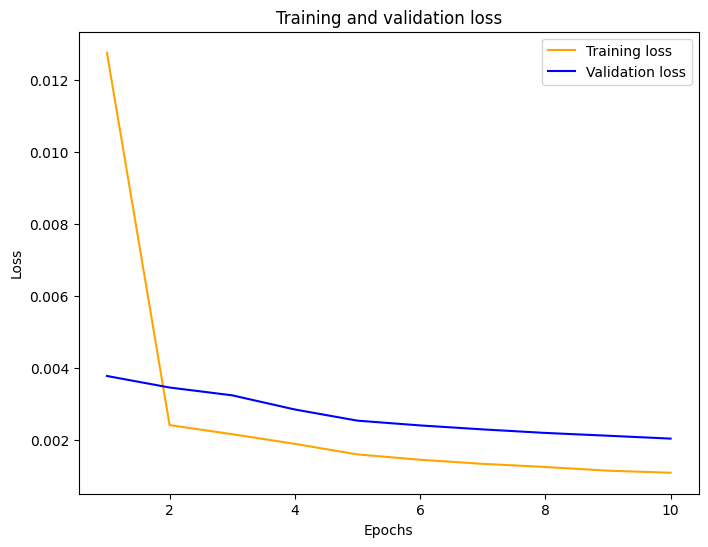

In [123]:
plot_curve(hist_1)

In [124]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.547260,0.549220
1,2021-12-10 15:25:00,0.588,0.525448,0.530727
2,2021-12-10 15:26:00,0.566,0.559986,0.566304
3,2021-12-10 15:27:00,0.562,0.562411,0.563963
4,2021-12-10 15:28:00,0.612,0.556879,0.556094
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.167451
3009,2021-12-16 13:59:00,0.169,0.168296,0.166877
3010,2021-12-16 14:00:00,0.147,0.168693,0.167348
3011,2021-12-16 14:01:00,0.145,0.155700,0.153813


In [125]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [126]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

[{'MSE': 0.002032446852201432,
  'RMSE': 0.04508266687099857,
  'MAE': 0.022171988740241927,
  'MAPE': 0.07886082206380847}]

In [127]:
compare_model(lstm_mape_error,lstm_mape_error8)

Better MSE value is :  0.07886082206380847


,Model,MSE error
0,model,0.086220
1,model_1,0.078861


In [220]:
data7 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\2351356658.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
8,5,Adam,32,,100,,,,,1,10,0.022172,0.078861,0.002032,0.045083


------------

### Add frist layer: units = 100 and Add Dropout = 0.1

In [129]:
model_2 = Sequential()
model_2.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 7s 10ms/step - loss: 0.0109 - val_loss: 0.0036
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0029 - val_loss: 0.0033
Epoch 3/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0026 - val_loss: 0.0030
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0023 - val_loss: 0.0027
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0021 - val_loss: 0.0027
Epoch 6/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0019 - val_loss: 0.0025
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0018 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 9/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0016 - val_loss: 0.0022
Epoch 10/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0016 - val_loss: 0.002

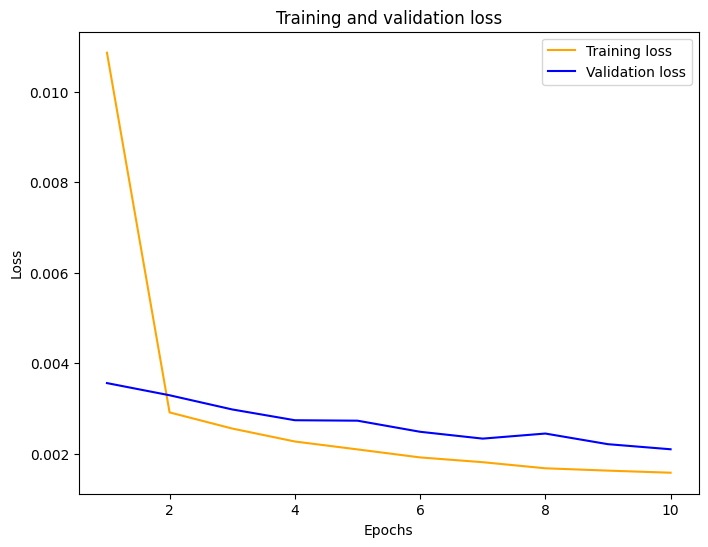

In [130]:
plot_curve(hist_2)

In [131]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.547260,0.549220,0.558415
1,2021-12-10 15:25:00,0.588,0.525448,0.530727,0.533572
2,2021-12-10 15:26:00,0.566,0.559986,0.566304,0.560404
3,2021-12-10 15:27:00,0.562,0.562411,0.563963,0.565079
4,2021-12-10 15:28:00,0.612,0.556879,0.556094,0.561035
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.167451,0.168921
3009,2021-12-16 13:59:00,0.169,0.168296,0.166877,0.168296
3010,2021-12-16 14:00:00,0.147,0.168693,0.167348,0.168611
3011,2021-12-16 14:01:00,0.145,0.155700,0.153813,0.156452


In [132]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [133]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
error(lstm_mse_error_100_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

[{'MSE': 0.002084247847532429,
  'RMSE': 0.04565356336073263,
  'MAE': 0.02263313311582244,
  'MAPE': 0.08328825683888831}]

In [134]:
compare_model(lstm_mape_error8,lstm_mape_error9)

Better MSE value is :  0.07886082206380847


,Model,MSE error
0,model,0.078861
1,model_1,0.083288


In [221]:
data8 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_100_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\3816290724.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
8,5,Adam,32,,100,,,,,1,10,0.022172,0.078861,0.002032,0.045083
9,5,Adam,32,,100,0.1,,,,1,10,0.022633,0.083288,0.002084,0.045654


------------------------------------

### Add frist layer: units = 100 and Add second layer: unit = 50

In [136]:
model_3 = Sequential()
model_3.add(LSTM(units = 100, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 12s 17ms/step - loss: 0.0090 - val_loss: 0.0038
Epoch 2/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0025 - val_loss: 0.0035
Epoch 3/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0022 - val_loss: 0.0032
Epoch 4/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 5/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0

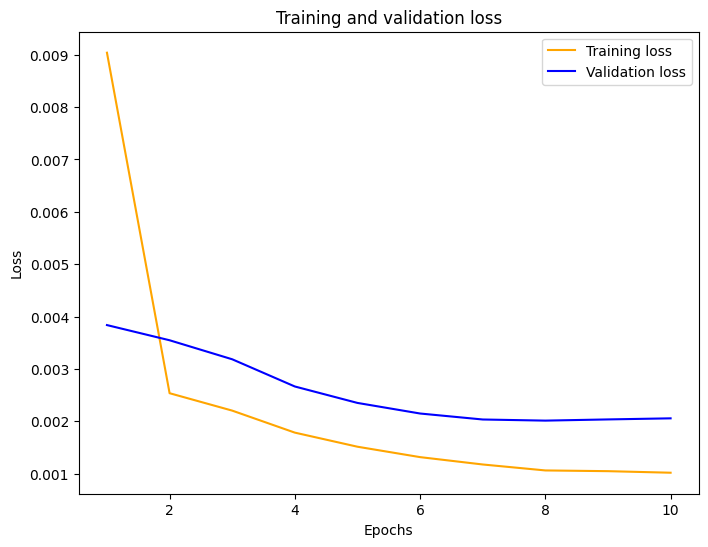

In [137]:
plot_curve(hist_3)

In [138]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.547260,0.549220,0.558415,0.557192
1,2021-12-10 15:25:00,0.588,0.525448,0.530727,0.533572,0.543026
2,2021-12-10 15:26:00,0.566,0.559986,0.566304,0.560404,0.594485
3,2021-12-10 15:27:00,0.562,0.562411,0.563963,0.565079,0.571539
4,2021-12-10 15:28:00,0.612,0.556879,0.556094,0.561035,0.565616
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.167451,0.168921,0.178402
3009,2021-12-16 13:59:00,0.169,0.168296,0.166877,0.168296,0.178045
3010,2021-12-16 14:00:00,0.147,0.168693,0.167348,0.168611,0.178880
3011,2021-12-16 14:01:00,0.145,0.155700,0.153813,0.156452,0.160888


In [139]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [140]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


[{'MSE': 0.0020469385150911645,
  'RMSE': 0.04524310461375484,
  'MAE': 0.022899974461814274,
  'MAPE': 0.11057977740182576}]

In [141]:
compare_model(lstm_mape_error8,lstm_mape_error11)

Better MSE value is :  0.07886082206380847


,Model,MSE error
0,model,0.078861
1,model_1,0.110580


In [222]:
data10 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\664629743.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
8,5,Adam,32,,100,,,,,1,10,0.022172,0.078861,0.002032,0.045083
9,5,Adam,32,,100,0.1,,,,1,10,0.022633,0.083288,0.002084,0.045654


---

### Add frist layer: units = 100 and change epochs from 10 to 20

In [143]:
model_5 = Sequential()
model_5.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
377/377 [==============================] - 7s 10ms/step - loss: 0.0074 - val_loss: 0.0034
Epoch 2/20
377/377 [==============================] - 3s 8ms/step - loss: 0.0022 - val_loss: 0.0031
Epoch 3/20
377/377 [==============================] - 2s 7ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 4/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 5/20
377/377 [==============================] - 2s 6ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 6/20
377/377 [==============================] - 2s 6ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 7/20
377/377 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/20
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/20
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/20
377/377 [==============================] - 2s 6ms/step - loss: 0.0010 - val_loss: 0.002

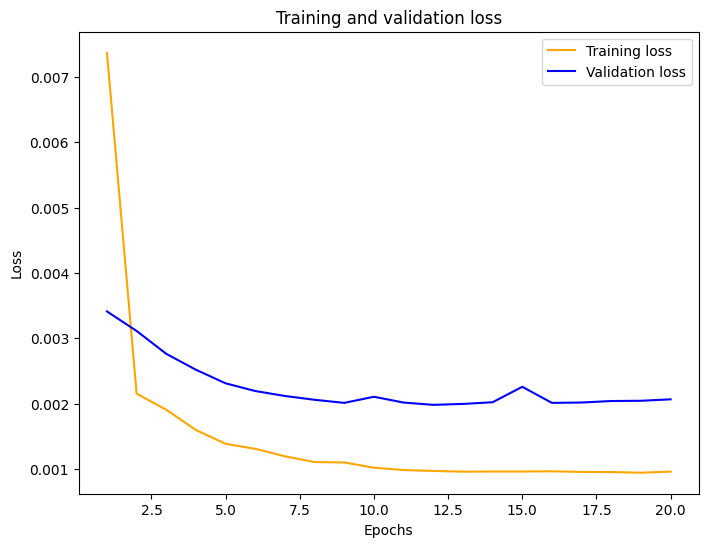

In [144]:
plot_curve(hist_5)

In [145]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.547260,0.549220,0.558415,0.557192,0.558138
1,2021-12-10 15:25:00,0.588,0.525448,0.530727,0.533572,0.543026,0.540296
2,2021-12-10 15:26:00,0.566,0.559986,0.566304,0.560404,0.594485,0.594543
3,2021-12-10 15:27:00,0.562,0.562411,0.563963,0.565079,0.571539,0.566304
4,2021-12-10 15:28:00,0.612,0.556879,0.556094,0.561035,0.565616,0.564586
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.167451,0.168921,0.178402,0.164591
3009,2021-12-16 13:59:00,0.169,0.168296,0.166877,0.168296,0.178045,0.164589
3010,2021-12-16 14:00:00,0.147,0.168693,0.167348,0.168611,0.178880,0.165567
3011,2021-12-16 14:01:00,0.145,0.155700,0.153813,0.156452,0.160888,0.143977


In [146]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [147]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

[{'MSE': 0.002057131031231387,
  'RMSE': 0.045355606392500004,
  'MAE': 0.02047604038042362,
  'MAPE': 0.07457708045273787}]

In [148]:
compare_model(lstm_mape_error8,lstm_mape_error12)

Better MSE value is :  0.07457708045273787


,Model,MSE error
0,model,0.078861
1,model_1,0.074577


In [223]:
data11 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\231752266.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
8,5,Adam,32,,100,,,,,1,10,0.022172,0.078861,0.002032,0.045083
9,5,Adam,32,,100,0.1,,,,1,10,0.022633,0.083288,0.002084,0.045654


---

### Add frist layer: units = 100 and change epochs from 20 to 30

In [150]:
model_4 = Sequential()
model_4.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_4.add(Dense(units = 1))
model_4.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
377/377 [==============================] - 7s 9ms/step - loss: 0.0142 - val_loss: 0.0037
Epoch 2/30
377/377 [==============================] - 3s 8ms/step - loss: 0.0024 - val_loss: 0.0034
Epoch 3/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0022 - val_loss: 0.0031
Epoch 4/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 5/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 6/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 7/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 8/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 9/30
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 10/30
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0021

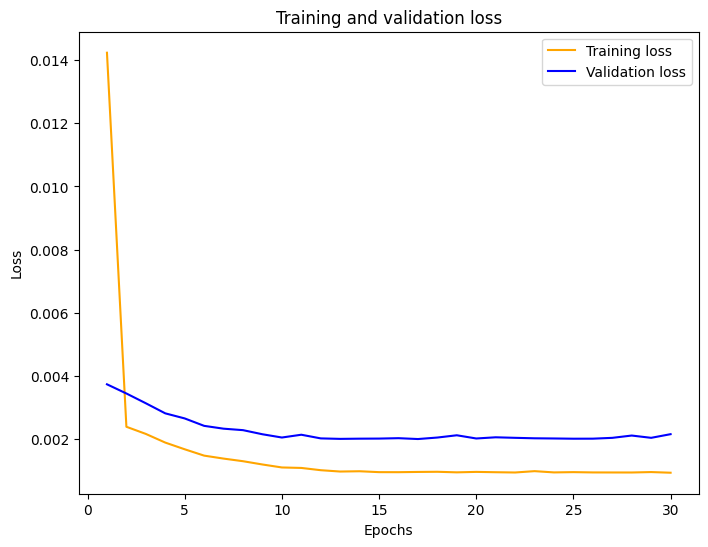

In [151]:
plot_curve(hist_4)

In [152]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_epoch30'] = predict_4
test3

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20,LSTM_epoch30
0,2021-12-10 15:24:00,0.538,0.547260,0.549220,0.558415,0.557192,0.558138,0.566319
1,2021-12-10 15:25:00,0.588,0.525448,0.530727,0.533572,0.543026,0.540296,0.548797
2,2021-12-10 15:26:00,0.566,0.559986,0.566304,0.560404,0.594485,0.594543,0.602169
3,2021-12-10 15:27:00,0.562,0.562411,0.563963,0.565079,0.571539,0.566304,0.576880
4,2021-12-10 15:28:00,0.612,0.556879,0.556094,0.561035,0.565616,0.564586,0.574258
...,...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168865,0.167451,0.168921,0.178402,0.164591,0.177128
3009,2021-12-16 13:59:00,0.169,0.168296,0.166877,0.168296,0.178045,0.164589,0.177047
3010,2021-12-16 14:00:00,0.147,0.168693,0.167348,0.168611,0.178880,0.165567,0.178084
3011,2021-12-16 14:01:00,0.145,0.155700,0.153813,0.156452,0.160888,0.143977,0.156122


In [153]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [154]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
lstm_rmse_error10 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch30"], squared=False)
lstm_mae_error10 = mae(test3["cloud_cover"], test3["LSTM_epoch30"])
lstm_mape_error10 = mape(test3['cloud_cover'], test3['LSTM_epoch30'])
error(lstm_mse_error_unit_50_epoch30,lstm_rmse_error10,lstm_mae_error10,lstm_mape_error10)

[{'MSE': 0.0021472610925215544,
  'RMSE': 0.046338548666542786,
  'MAE': 0.023905074084142375,
  'MAPE': 0.10261337132437792}]

In [155]:
compare_model(lstm_mape_error12,lstm_mape_error10)

Better MSE value is :  0.07457708045273787


,Model,MSE error
0,model,0.074577
1,model_1,0.102613


In [224]:
data9 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':30 , 'MAE error':lstm_mae_error10, 'MAPE error' : lstm_mape_error10,'MSE error':lstm_mse_error_unit_50_epoch30, 'RMSE error':lstm_rmse_error10}]

mse_data = mse_data.append(data9,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_9240\510127436.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,,50,,,,,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,,50,,,,,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.1,50,,,,,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.05,50,,,,,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.01,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,,,,,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,,,,,1,10,0.022388,0.092431,0.002054,0.045323
8,5,Adam,32,,100,,,,,1,10,0.022172,0.078861,0.002032,0.045083
9,5,Adam,32,,100,0.1,,,,1,10,0.022633,0.083288,0.002084,0.045654


---

# save model

In [229]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [230]:
mse_data.to_csv('data_lstm_mse_lag5.csv',index=False)

In [231]:
lstm = pd.read_csv('data_lstm_mse_lag5.csv')

In [232]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.023304,0.086220,0.002084,0.045656
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.026051,0.099542,0.002290,0.047852
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.026095,0.104324,0.002440,0.049398
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.029741,0.122874,0.002586,0.050855
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.032410,0.109154,0.002627,0.051257
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.022388,0.092431,0.002054,0.045323
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.025692,0.123222,0.002101,0.045832
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.022388,0.092431,0.002054,0.045323
8,5,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.022172,0.078861,0.002032,0.045083
9,5,Adam,32,NaN,100,0.1,NaN,NaN,NaN,1,10,0.022633,0.083288,0.002084,0.045654


# error

In [233]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002032,0.045083
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [211]:
model_5.save('model_train_80%_lag5.h5')